# 1. Getting Started: Airbnb Copenhagen

This assignment deals with the most recent Airbnb listings in Copenhagen. The data is collected from [Inside Airbnb](http://insideairbnb.com/copenhagen). Feel free to explore the website further in order to better understand the data. The data (*listings.csv*) has been collected as raw data and needs to be preprocessed.

**Hand-in:** Hand in as a group in Itslearning in a **single**, well-organized and easy-to-read Jupyter Notebook. Please just use this notebook to complete the assignment.

If your group consists of students from different classes, upload in **both** classes.

The first cell does some preprocessing. Please just run these cells and do not change anything. The assignment starts below. Make sure that listings.csv' is in the same folder as this notebook




,id,name,host_id,host_name,neighbourhood_cleansed,latitude,longitude,room_type,price,minimum_nights,...,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month,calculated_host_listings_count,availability_365,price_category
0,6983,Copenhagen 'N Livin',16774,Simon,Nørrebro,55.686410,12.547410,Entire home/apt,898.0,3,...,4.79,4.78,4.86,4.89,4.73,4.71,1.08,1,0,0
1,26057,Lovely house - most attractive area,109777,Kari,Indre By,55.693070,12.576490,Entire home/apt,2600.0,4,...,4.93,4.96,4.93,4.86,4.94,4.81,0.55,1,303,1
2,26473,City Centre Townhouse Sleeps 1-10 persons,112210,Julia,Indre By,55.676020,12.575400,Entire home/apt,3250.0,3,...,4.63,4.44,4.78,4.70,4.89,4.59,2.06,3,56,1
3,29118,Best Location in Cool Istedgade,125230,Nana,Vesterbro-Kongens Enghave,55.670230,12.555040,Entire home/apt,725.0,7,...,4.87,4.73,5.00,5.00,4.87,4.80,0.16,1,59,0
4,31094,"Beautiful, spacious, central, renovated Penthouse",129976,Ebbe,Vesterbro-Kongens Enghave,55.666602,12.555283,Entire home/apt,1954.0,3,...,4.82,4.88,4.87,4.82,4.80,4.53,0.13,1,0,1


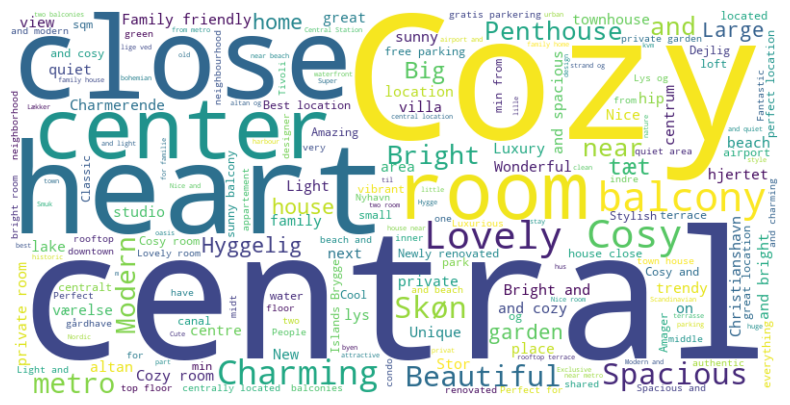

In [368]:
# pip install pandas
# pip install scikit-learn
import pandas as pd
import sklearn as sk

# load the data
data = pd.read_csv('listings.csv')

# filter relevant columns
data_limited = data[["id",
    "name",
    "host_id"  ,
    "host_name" , 
    "neighbourhood_cleansed"  ,
    "latitude"  ,
    "longitude"  ,
    "room_type"  ,
    "price"  ,
    "minimum_nights"  ,
    "number_of_reviews",  
    "last_review"  ,
    "review_scores_rating"  ,
    "review_scores_accuracy" , 
    "review_scores_cleanliness"  ,
    "review_scores_checkin"  ,
    "review_scores_communication"  ,
    "review_scores_location"  ,
    "review_scores_value"  ,
    "reviews_per_month"  ,
    "calculated_host_listings_count"  ,
    "availability_365",]]

# removing rows with no reviews

data_filtered = data_limited.loc[data_limited['number_of_reviews'] != 0]

# remove nan

data_filtered = data_filtered.dropna()
data_filtered.head()

# get a list of distinct values from neighbourhood_cleansed columns in data_filtered

neighbourhoods = data_filtered["neighbourhood_cleansed"].unique()

# replace e.g. Nrrbro with Nørrebro in neighbourhood_cleansed column

data_filtered["neighbourhood_cleansed"] = data_filtered["neighbourhood_cleansed"].replace("Nrrebro", "Nørrebro")
data_filtered["neighbourhood_cleansed"] = data_filtered["neighbourhood_cleansed"].replace("sterbro", "Østerbro")
data_filtered["neighbourhood_cleansed"] = data_filtered["neighbourhood_cleansed"].replace("Vanlse", "Vanløse")
data_filtered["neighbourhood_cleansed"] = data_filtered["neighbourhood_cleansed"].replace("Brnshj-Husum", "Brønshøj-Husum")
neighbourhoods = data_filtered["neighbourhood_cleansed"].unique()

# Remove dollar signs and commas and convert to float - note the prices are actually in DKK
data_filtered['price'] = data_filtered['price'].replace(r'[\$,]', '', regex=True).astype(float)


# Calculate the median price
median_price = data_filtered['price'].median()

# Create a new column 'price_category' with 0 for 'affordable' and 1 for 'expensive'
data_filtered['price_category'] = (data_filtered['price'] > median_price).astype(int)

display(data_filtered.head())

# Describe the apartments using a wordcloud
# Remember to install packages
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Combine the two lists of stop words
stop_words = ['Østerbro', 'Copenhagen', 'København', 'in', 'bedroom', 'bedrooms', 'bed', 'beds', 'bath', 'baths', 'Frederiksberg', 'V', 'Ø', 'SV', 'S', 'N', 'K', 'C', 'W', 'kbh', 'Ballerup', 'Hellerup', 'Valby', 'Vanløse', 'Brønhøj', 'Nørrebro', 'Vesterbro', "CPH", "with", "to", "of", "a", "the", "på", "i", "med", "af", "at", "city", "by", "apartment", "appartment", "lejlighed", "flat", "m2", "apt"]

# Convert the 'name' column to a single string
text = ' '.join(data_filtered['name'].astype(str))

# Create and generate a word cloud image
wordcloud = WordCloud(stopwords=stop_words, background_color="white", width=800, height=400).generate(text)

# Display the generated word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

## Your tasks start here


### 1. Since data science is so much fun, provide a word cloud of the names of the hosts, removing any names of non-persons. Does this more or less correspond with the distribution of names according to [Danmarks Statistik](https://www.dst.dk/da/Statistik/emner/borgere/navne/navne-i-hele-befolkningen)?

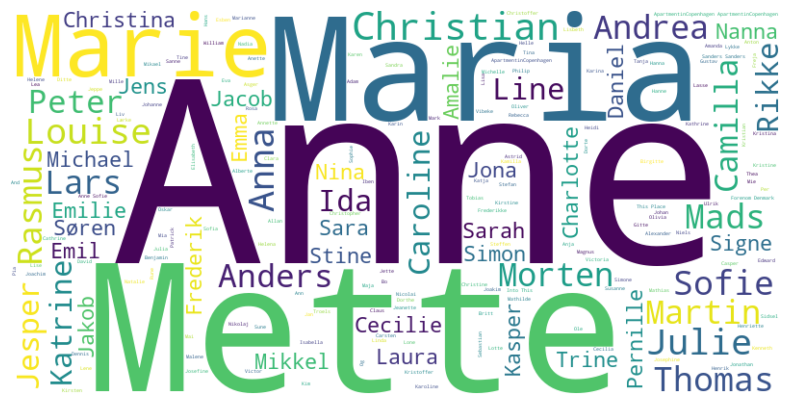

In [369]:
# Convert the 'host_name' column to a single string
text = ' '.join(data_filtered['host_name'].astype(str))

# Create and generate a word cloud image
wordcloud = WordCloud(stopwords=stop_words, background_color="white", width=800, height=400).generate(text)

# Display the generated word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### 2. Using non-scaled versions of latitude and longitude, plot the listings data on a map.

In [370]:
import folium
from folium.plugins import MarkerCluster

# Create a base map centered on Copenhagen.
map_center = [55.6761, 12.5683]  # Coordinates for Copenhagen
base_map = folium.Map(location=map_center, zoom_start=13)

# Use MarkerCluster to group close markers together
marker_cluster = MarkerCluster().add_to(base_map)

# Add each listing as a marker on the map
for idx, row in data_filtered.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=f"{row['name']} - {row['price']} DKK",
        icon=folium.Icon(color='blue', icon='info-sign')
    ).add_to(marker_cluster)

# Display the map
base_map

### 3. Create boxplots where you have the neighbourhood on the x-axis and price on the y-axis. What does this tell you about the listings in Copenhagen? Keep the x-axis as is and move different variables into the y-axis to see how things are distributed between the neighborhoods to create different plots (your choice).

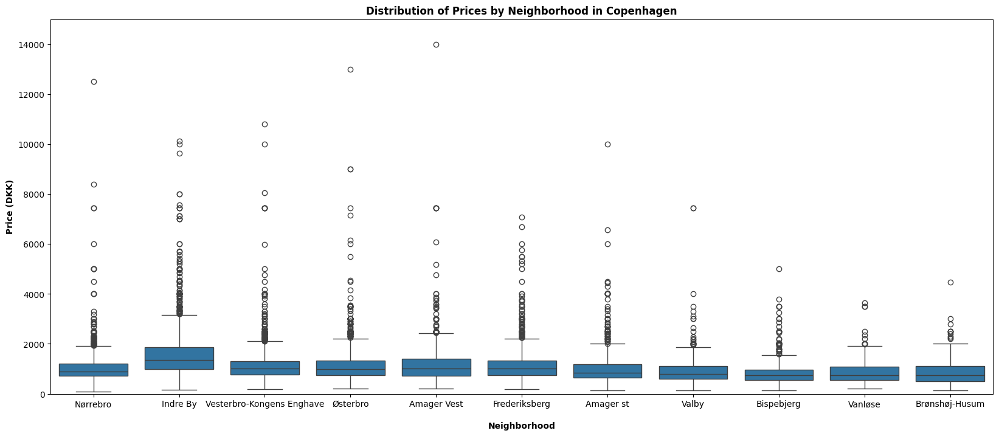

In [371]:
import seaborn as sns #Data visualization library

#Create boxplot
# 1 Price by neighborhood
plt.figure(figsize=(20, 8))
sns.boxplot(x='neighbourhood_cleansed', y='price', data=data_filtered)

plt.xlabel('\nNeighborhood',fontweight='bold')
plt.ylabel('Price (DKK)',fontweight='bold')
plt.title('Distribution of Prices by Neighborhood in Copenhagen',fontweight='bold')
plt.ylim(0, 15000)
plt.show()

In [372]:
## A boxplot is a graphical representation that illustrates the distribution of data.
## By examining the boxplot, you can identify which neighborhoods have higher or lower median prices, which neighborhoods have a wide range of prices, and which neighborhoods have many outliers. 
# Input: X (Independent variable / Feature)
# Output: Y (Dependent variable)
# Outliers: Data points that deviate significantly from the overall pattern.


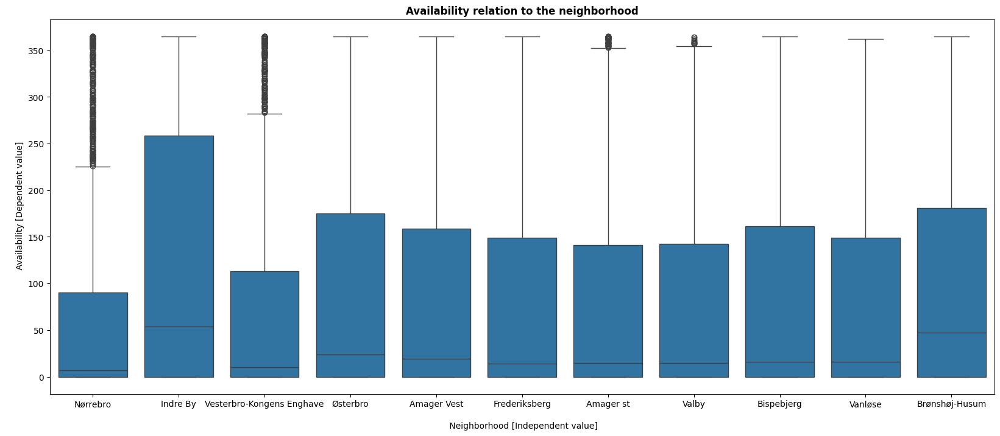

In [373]:
import matplotlib.pyplot as plt

# Create boxplot
# 2 Availability
plt.figure(figsize=(20, 8))
sns.boxplot(x='neighbourhood_cleansed', y='availability_365', data=data_filtered)

plt.xlabel('\n Neighborhood [Independent value]')
plt.ylabel('\n Availability [Dependent value]')
plt.title('Availability relation to the neighborhood', fontweight='bold')
plt.show()


### 4. Do a descriptive analysis of the neighborhoods. Include information about room type in the analysis as well as one other self-chosen feature. The descriptive analysis should contain mean/average, mode, median, standard deviation/variance, minimum, maximum and quartiles.

In [374]:
# ~~ Metrics definition ~~
# Mean: The average price in each neighborhood.
# Mode: Most frequent occurring price.
# Count: The number of listings in each neighborhood.
# Average: The average price in each neighborhood.
# 50% -Median: The median price, where half the listings are above and half are below this value.
# Standard Deviation (std): Show how much prices vary within each neighborhood.
# Min and Max: The lowest and highest price.
# 25% and 75% -Quartiles: Divide dataset into First Quarter and Third Quarter


# Group by 'neighbourhood_cleansed' and 'room_type'
grouped_data = data_filtered.groupby(['neighbourhood_cleansed', 'room_type'])[['price']]

# Calculate descriptive statistics, including mode and quartiles
descriptive_stats = grouped_data.agg(
    mean=('price', 'mean'),
    median=('price', 'median'),
    min=('price', 'min'),
    max=('price', 'max'),
    std=('price', 'std'),
    mode=('price', lambda x: x.mode()[0]),  # Getting the mode
    Q1=('price', lambda x: x.quantile(0.25)),  # First quartile
    Q2=('price', lambda x: x.quantile(0.5)),   # Second quartile (median)
    Q3=('price', lambda x: x.quantile(0.75)),   # Third quartile
    count=('price', 'count')
)

# Reset index for better readability
descriptive_stats.reset_index(inplace=True)

# Display the results
display(descriptive_stats)




,neighbourhood_cleansed,room_type,mean,median,min,max,std,mode,Q1,Q2,Q3,count
0,Amager Vest,Entire home/apt,1234.226623,1050.0,250.0,14000.0,832.696891,1000.0,814.00,1050.0,1480.00,909
1,Amager Vest,Private room,1032.966216,500.0,200.0,64900.0,5299.018095,500.0,400.00,500.0,655.00,148
2,Amager Vest,Shared room,1051.500000,1051.5,972.0,1131.0,112.429978,972.0,1011.75,1051.5,1091.25,2
3,Amager st,Entire home/apt,1093.584071,900.0,240.0,10000.0,721.982284,1000.0,700.00,900.0,1200.00,791
4,Amager st,Hotel room,1296.000000,1201.0,1149.0,1538.0,211.184753,1149.0,1175.00,1201.0,1369.50,3
5,Amager st,Private room,549.325581,471.0,135.0,2000.0,293.995992,450.0,400.00,471.0,600.00,129
6,Amager st,Shared room,2575.000000,2575.0,2575.0,2575.0,NaN,2575.0,2575.00,2575.0,2575.00,1
7,Bispebjerg,Entire home/apt,992.592520,800.0,235.0,44000.0,1981.580545,700.0,600.00,800.0,1000.00,508
8,Bispebjerg,Private room,488.978947,400.0,143.0,3000.0,353.674089,300.0,300.00,400.0,528.50,95
9,Bispebjerg,Shared room,198.000000,198.0,198.0,198.0,NaN,198.0,198.00,198.0,198.00,1


### 5. Based on self-chosen features, develop three different regression models that can predict the price of a rental property. Remember to divide your data into training data and test data. Comment on your findings.

In [375]:
# Step 1: Select features and target variable
X = data_filtered[['number_of_reviews', 'room_type', 'availability_365']]
y = data_filtered['price']

# Step 2: One-hot encode categorical variables
X = pd.get_dummies(X, columns=['room_type'], drop_first=True)

# Step 3: Split the data
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 4: Build and train regression models
# Model 1: Ridge Regression
from sklearn.linear_model import Ridge
ridge_reg = Ridge(alpha=1.0)
ridge_reg.fit(X_train, y_train)
ridge_pred = ridge_reg.predict(X_test)

# Model 2: Decision Tree Regressor
from sklearn.tree import DecisionTreeRegressor
tree_reg = DecisionTreeRegressor(random_state=42)
tree_reg.fit(X_train, y_train)
tree_pred = tree_reg.predict(X_test)

# Model 3: Random Forest Regressor
from sklearn.ensemble import RandomForestRegressor
forest_reg = RandomForestRegressor(random_state=42)
forest_reg.fit(X_train, y_train)
forest_pred = forest_reg.predict(X_test)

# Step 5: Evaluate the models
from sklearn.metrics import mean_squared_error, r2_score
models = {
    "Ridge Regression": ridge_pred,
    "Decision Tree": tree_pred,
    "Random Forest": forest_pred
}

for model_name, predictions in models.items():
    mse = mean_squared_error(y_test, predictions)
    r2 = r2_score(y_test, predictions)
    print(f"{model_name} - MSE: {mse:.2f}, R²: {r2:.2f}")


Ridge Regression - MSE: 786701.73, R²: 0.09
Decision Tree - MSE: 1523731.54, R²: -0.76
Random Forest - MSE: 991945.49, R²: -0.15


In [376]:
## Conclusion
# Ridge Regression performs the best among the three models, with the lowest MSE and the highest R² score.
# Overall, all three models perform poorly, as indicated by low R² scores and high MSE values. 
# Suggests that the features used in the models may not be sufficient to predict the price of listings accurately.

In [377]:
# Let's try to improve the model by adding new features and retraining the same models.

# Step 1: Add a binary feature for "central" in the name
data_filtered['is_central'] = data_filtered['name'].str.contains('central', case=False).astype(int)

# Step 2: Select features and target variable
X = data_filtered[['number_of_reviews', 'availability_365', 'neighbourhood_cleansed', 'is_central', 'room_type']]
y = data_filtered['price']

# Step 3: One-hot encode categorical variables
X = pd.get_dummies(X, columns=['neighbourhood_cleansed', 'room_type'], drop_first=True)

# Step 4: Split the data
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


# Step 5: Build and train regression models

# Model 1: Ridge Regression
from sklearn.linear_model import Ridge
ridge_reg = Ridge(alpha=1.0)
ridge_reg.fit(X_train, y_train)
ridge_pred = ridge_reg.predict(X_test)

# Model 2: Decision Tree Regressor
from sklearn.tree import DecisionTreeRegressor
tree_reg = DecisionTreeRegressor(random_state=42)
tree_reg.fit(X_train, y_train)
tree_pred = tree_reg.predict(X_test)

# Model 3: Random Forest Regressor
from sklearn.ensemble import RandomForestRegressor
forest_reg = RandomForestRegressor(random_state=42)
forest_reg.fit(X_train, y_train)
forest_pred = forest_reg.predict(X_test)

# Step 6: Evaluate the models
from sklearn.metrics import mean_squared_error, r2_score

models = {
    "Ridge Regression": ridge_pred,
    "Decision Tree": tree_pred,
    "Random Forest": forest_pred
}

for model_name, predictions in models.items():
    mse = mean_squared_error(y_test, predictions)
    r2 = r2_score(y_test, predictions)
    print(f"{model_name} - MSE: {mse:.2f}, R²: {r2:.2f}")

Ridge Regression - MSE: 765272.73, R²: 0.12
Decision Tree - MSE: 1180103.07, R²: -0.36
Random Forest - MSE: 928748.31, R²: -0.07


In [378]:
## Conclusion
# Added two new features 'is_central' and based on the presence of the word 'central' in the listing name.
# The Ridge Regression model shows a slight improvement in performance, with a lower MSE and a higher R² score.

In [379]:
# Lets try to Improve the model by replacing poor performing models with Lasso and Elastic Net regression and keeping Ridge regression model and same features.


# Step 1: Add a binary feature for "central" in the name
data_filtered['is_central'] = data_filtered['name'].str.contains('central', case=False).astype(int)

# Step 2: Select features and target variable
X = data_filtered[['number_of_reviews', 'availability_365', 'neighbourhood_cleansed', 'is_central', 'room_type']]
y = data_filtered['price']

# Step 3: One-hot encode categorical variables
X = pd.get_dummies(X, columns=['neighbourhood_cleansed', 'room_type'], drop_first=True)

# Step 4: Split the data
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 5: Build and train regression models

# Model 1: Ridge Regression
from sklearn.linear_model import Ridge
ridge_reg = Ridge(alpha=1.0)
ridge_reg.fit(X_train, y_train)
ridge_pred = ridge_reg.predict(X_test)

# Model 2: Lasso Regression
from sklearn.linear_model import Lasso
lasso_reg = Lasso(alpha=1.0)
lasso_reg.fit(X_train, y_train)
lasso_pred = lasso_reg.predict(X_test)

# Model 3: Elastic Net Regression
from sklearn.linear_model import ElasticNet
elastic_net_reg = ElasticNet(alpha=1.0, l1_ratio=0.5)
elastic_net_reg.fit(X_train, y_train)
elastic_net_pred = elastic_net_reg.predict(X_test)

# Step 6: Evaluate the models
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

models = {
    "Ridge Regression": ridge_pred,
    "Lasso Regression": lasso_pred,
    "Elastic Net Regression": elastic_net_pred
}

for model_name, predictions in models.items():
    mse = mean_squared_error(y_test, predictions)
    r2 = r2_score(y_test, predictions)
    mae = mean_absolute_error(y_test, predictions)
    print(f"{model_name} - MSE: {mse:.2f}, R²: {r2:.2f}, MAE: {mae:.2f}")

Ridge Regression - MSE: 765272.73, R²: 0.12, MAE: 442.68
Lasso Regression - MSE: 766052.36, R²: 0.12, MAE: 443.11
Elastic Net Regression - MSE: 813290.78, R²: 0.06, MAE: 476.09


In [380]:
## Conclusion
#  The introduction new regression models did not result in significant improvements over the Ridge Regression.